In [1]:
# Exploración de Datos - Predicción de Bajo Rendimiento Académico

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Configuraciones generales
pd.set_option('display.float_format', lambda x: '%.2f' % x)



# Análisis Exploratorio de Datos (EDA) para el Dataset de Calificaciones

## 1.1. Definición de Variables - Dataset de Calificaciones

| Variable                  | Descripción                                                                 | Tipo de Dato         |
|---------------------------|-----------------------------------------------------------------------------|----------------------|
| `Sede`                    | Nombre de la sede o campus donde estudia el estudiante                      | `str` (texto)        |
| `Estudiante`              | Nombre completo del estudiante                                              | `str` (texto)        |
| `Documento de identidad`  | Identificador único del estudiante                                          | `str` (texto, hasheado) |
| `Grado`                   | Grado académico que cursa el estudiante (ej. 1, 2, 3...)                    | `int` (entero)       |
| `Grupo`                   | Letra o código del grupo del estudiante dentro del grado                    | `str` (texto)        |
| `Periodo`                 | Periodo académico (ej. I, II, III, IV)                                      | `str` (texto)        |
| `Año`                     | Año académico                                                               | `int` (entero)       |
| `Intensidad Horaria`      | Número de horas dedicadas a la asignatura                                   | `int` (entero)       |
| `Asignatura`              | Nombre de la materia evaluada (ej. Matemáticas, Inglés)                     | `str` (texto)        |
| `Cognitiva`               | Nota del componente/dimensión cognitivo (conocimiento teórico)              | `float` (decimal)    |
| `Procedimental`           | Nota del componente/dimensión procedimental (habilidades prácticas)         | `float` (decimal)    |
| `Actitudinal`             | Nota del componente/dimensión actitudinal (comportamiento, participación)   | `float` (decimal)    |
| `Axiologica`              | Nota del componente/dimensión axiológico (valores, ética)                   | `float` (decimal)    |
| `Docente`                 | Nombre del docente que reporta la calificación                              | `str` (texto)        |
| `Resultado`               | Nota final integrada de la asignatura                                       | `float` (decimal)    |
| `Nivel`                   | Nivel de desempeño asignado (ej. Bajo, Básico, Alto, Superior)              | `str` (texto)        |

## 1.2. Reporte EDA automatico

In [2]:
# Carga del dataset
df = pd.read_csv("../../data/processed/data_clean_notes_2023_2025.csv")  # Reemplaza con la ruta real

df['Docente'] = df['Docente'].replace('INVESTIGACIÓNNICOLÁS CONTRERAS ANAVE', 'NICOLÁS CONTRERAS ANAVE')

In [30]:
'''
from ydata_profiling import ProfileReport

# Crear el perfil con la variable objetivo de tipo numérica
profile = ProfileReport(df, title="Reporte de EDA - Notas",  explorative=True)
# Guardar el reporte en un archivo HTML
profile.to_file("../../data/processed/eda_reporte_notas_ProfileReport_Resultado.html")
'''

'\nfrom ydata_profiling import ProfileReport\n\n# Crear el perfil con la variable objetivo de tipo numérica\nprofile = ProfileReport(df, title="Reporte de EDA - Notas",  explorative=True)\n# Guardar el reporte en un archivo HTML\nprofile.to_file("../../data/processed/eda_reporte_notas_ProfileReport_Resultado.html")\n'

## 1.3. Reporte Sweetviz

In [31]:
'''"EDA_notes_DL Resultado.ipynb"import sweetviz as sv
# Crear el reporte
report = sv.analyze(df, target_feat='Resultado')

# Mostrar el reporte en archivo HTML
report.show_html("../../data/processed/eda_reporte_notas_sweetviz.html")

report = sv.compare([df[df['Sede'] == 'FUSAGASUGÁ'], "FUSAGASUGÁ"], 
                    [df[df['Sede'] == 'GIRARDOT'], "GIRARDOT"],
                    target_feat='Resultado')
report.show_html("../../data/processed/eda_reporte_comparativo_sede_sweetvizs_Resultado.html")
'''

'"EDA_notes_DL Resultado.ipynb"import sweetviz as sv\n# Crear el reporte\nreport = sv.analyze(df, target_feat=\'Resultado\')\n\n# Mostrar el reporte en archivo HTML\nreport.show_html("../../data/processed/eda_reporte_notas_sweetviz.html")\n\nreport = sv.compare([df[df[\'Sede\'] == \'FUSAGASUGÁ\'], "FUSAGASUGÁ"], \n                    [df[df[\'Sede\'] == \'GIRARDOT\'], "GIRARDOT"],\n                    target_feat=\'Resultado\')\nreport.show_html("../../data/processed/eda_reporte_comparativo_sede_sweetvizs_Resultado.html")\n'

In [3]:
def codificar_variables(df):
    mapeos = {}

    # Mapear Sede
    mapeos['Sede'] = {'FUSAGASUGÁ': 1, 'GIRARDOT': 2}
    df['Sede'] = df['Sede'].replace(mapeos['Sede'])
    
    # Mapear Grupo
    mapeos['Grupo'] = {'A': 1, 'B': 2}
    df['Grupo'] = df['Grupo'].replace(mapeos['Grupo'])

    # Mapear Nivel
    mapeos['Nivel'] = {'SUPERIOR': 1, 'ALTO': 2, 'BÁSICO': 3, 'BAJO': 4}
    df['Nivel'] = df['Nivel'].replace(mapeos['Nivel'])

    # Categorías con códigos para Asignatura y Docente
    for col in ['Asignatura', 'Docente']:
        categorias = df[col].astype('category').cat.categories
        mapping = {cat: code + 1 for code, cat in enumerate(categorias)}
        df[col] = df[col].map(mapping)
        mapeos[col] = mapping

    return df, mapeos

In [4]:
# Estilo personalizado para gráficos
import seaborn as sns
import matplotlib.pyplot as plt

# --- Configuración de estilo BlueLight ---
def configurar_estilo_bluelight():
    sns.set_theme(style="whitegrid")
    plt.rcParams.update({
        "axes.facecolor": "#F5F9FF",
        "figure.facecolor": "#F5F9FF",
        "axes.edgecolor": "#CCCCCC",
        "axes.labelcolor": "#333333",
        "xtick.color": "#333333",
        "ytick.color": "#333333",
        "text.color": "#003366",
        "axes.titleweight": "bold",
        "axes.titlesize": 14,
        "axes.titlecolor": "#003366"
    })

# Función para mostrar múltiples gráficos en una cuadrícula de 4 columnas
def mostrar_graficos_en_grid(graficos, titulo_general=None):
    configurar_estilo_bluelight()
    n = len(graficos)
    cols = 4
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
    if titulo_general:
        fig.suptitle(titulo_general, fontsize=16, color='#003366', weight='bold')
    axes = axes.flatten()

    for i, grafico in enumerate(graficos):
        grafico(axes[i])

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


## 1.4. Vista general del dataset

In [5]:


# 1. Vista general del dataset
print("--- Forma del dataset:", df.shape)
print("\n--- Tipos de datos:")
print(df.dtypes)
print("\n--- Valores nulos por columna:")
print(df.isnull().sum())
print("\n--- Estadísticas descriptivas:")
print(df.describe())


--- Forma del dataset: (32676, 16)

--- Tipos de datos:
Sede                   object
Estudiante             object
Grado                   int64
Grupo                  object
Periodo                 int64
Año                     int64
Intensidad_Horaria      int64
Asignatura             object
Cog                   float64
Proc                  float64
Act                     int64
Axi                     int64
Docente                object
Resultado               int64
Nivel                  object
Identificación         object
dtype: object

--- Valores nulos por columna:
Sede                    0
Estudiante              0
Grado                   0
Grupo                   0
Periodo                 0
Año                     0
Intensidad_Horaria      0
Asignatura              0
Cog                   105
Proc                  105
Act                     0
Axi                     0
Docente                 0
Resultado               0
Nivel                   0
Identificación          0
dt

# 2. Análisis mediante gráficos

## 2.1. Distribución de la variable objetivo: Resultado

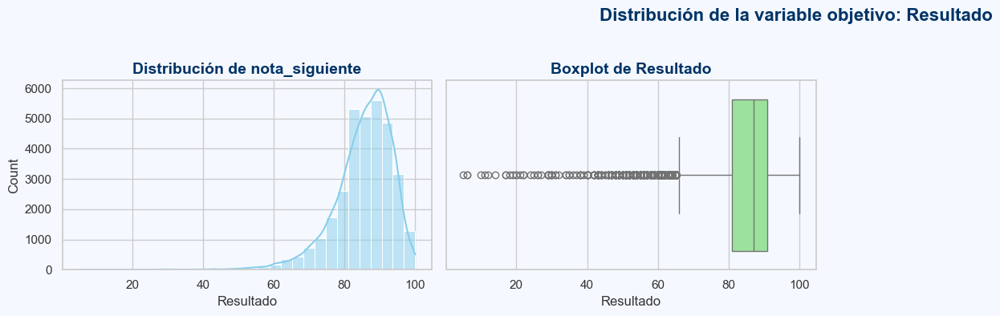

In [6]:

funciones = []

# Histograma con KDE
funciones.append(lambda ax: sns.histplot(
    df['Resultado'],
    bins=30,
    kde=True,
    color='skyblue',
    ax=ax
).set_title('Distribución de nota_siguiente'))

# Boxplot
funciones.append(lambda ax: sns.boxplot(
    x=df['Resultado'],
    color='lightgreen',
    ax=ax
).set_title('Boxplot de Resultado'))

# Mostrar en grid
mostrar_graficos_en_grid(funciones, titulo_general="Distribución de la variable objetivo: Resultado")




## 2.2. Análisis de bajo rendimiento (definición de umbral)


--- Proporción de bajo rendimiento:
bajo_rendimiento
False   0.81
True    0.19
Name: proportion, dtype: float64


C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\3613931815.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  funciones.append(lambda ax: sns.countplot(


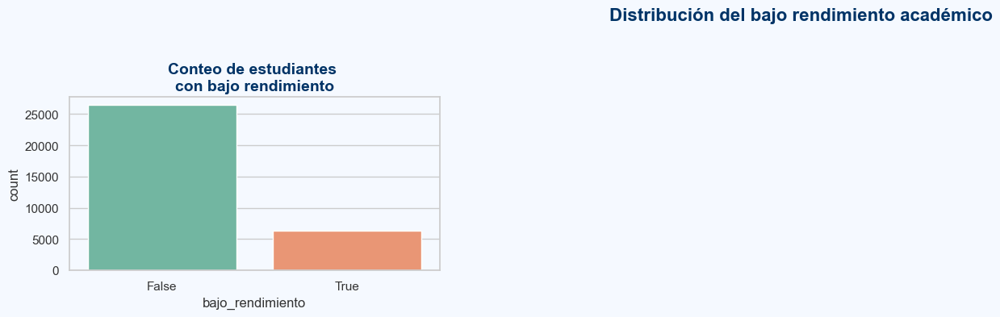

In [7]:

# 4. Análisis de bajo rendimiento (definición de umbral)
umbral = 80
df['bajo_rendimiento'] = df['Resultado'] < umbral
print("\n--- Proporción de bajo rendimiento:")
print(df['bajo_rendimiento'].value_counts(normalize=True))

# Crear función para el gráfico
funciones = []

funciones.append(lambda ax: sns.countplot(
    data=df,
    x='bajo_rendimiento',
    palette='Set2',
    ax=ax
).set_title('Conteo de estudiantes \ncon bajo rendimiento'))

# Mostrar en grid
mostrar_graficos_en_grid(funciones, titulo_general="Distribución del bajo rendimiento académico")


## 2.3. Proporción de Riesgo por Estudiante, Año y Periodo

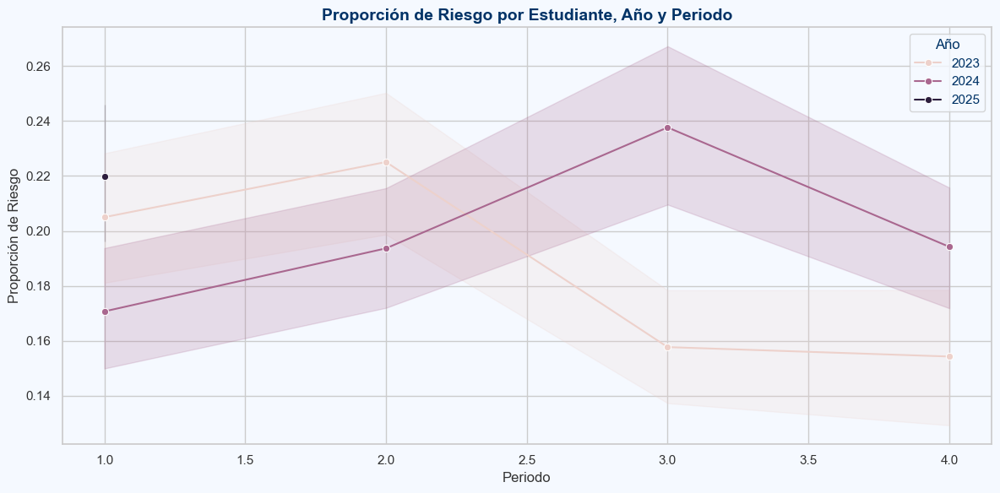

In [8]:
## Riesgo por Estudiante, Año y Periodo

fig, ax = plt.subplots(figsize=(12, 6))
riesgo_por_periodo = df.groupby(['Identificación', 'Año', 'Periodo'])['bajo_rendimiento'].mean().reset_index()
sns.lineplot(data=riesgo_por_periodo, x='Periodo', y='bajo_rendimiento', hue='Año', marker='o', ax=ax)
ax.set_title("Proporción de Riesgo por Estudiante, Año y Periodo")
ax.set_ylabel("Proporción de Riesgo")
ax.set_xlabel("Periodo")
plt.grid(True)
plt.tight_layout()
plt.show()


## 2.4.  Distribución de Resultado por Periodo y Año

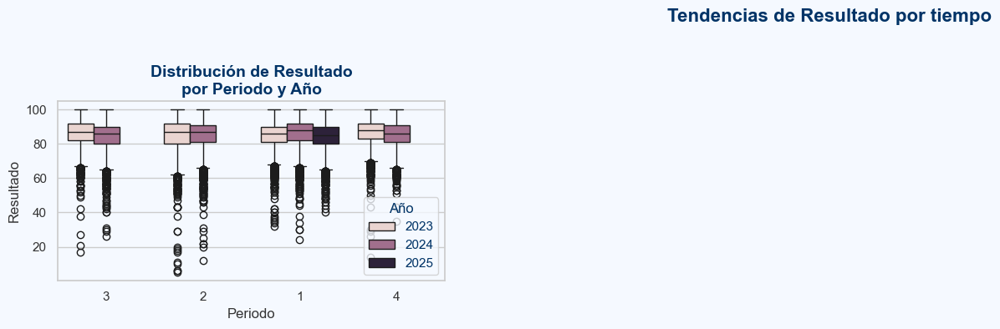

In [9]:

# 5. Tendencias por tiempo o periodo
funciones = []

if 'Periodo' in df.columns and 'Año' in df.columns:
    df['Periodo'] = df['Periodo'].astype(str)  # Asegurar tipo string

    funciones.append(lambda ax: sns.boxplot(
        data=df,
        x='Periodo',
        y='Resultado',
        hue='Año',
        ax=ax
    ).set_title('Distribución de Resultado\npor Periodo y Año'))

    mostrar_graficos_en_grid(funciones, titulo_general="Tendencias de Resultado por tiempo")


## 2.5. Evolución del rendimiento promedio por sede 

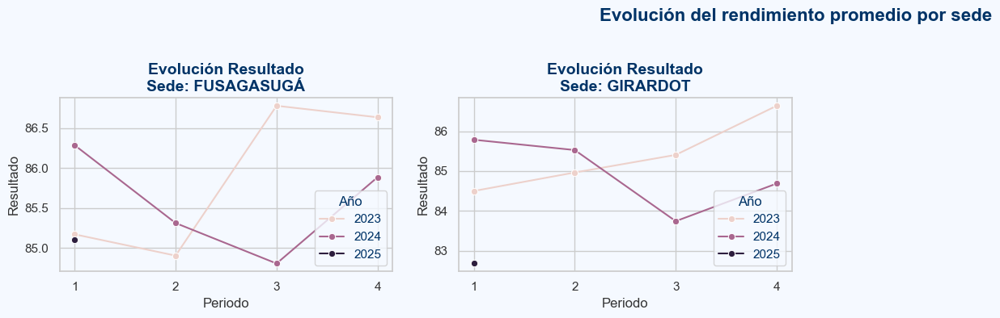

In [10]:
## 7. Evolución temporal del rendimiento promedio
# Agrupar por sede, año y periodo
rendimiento_sede = df.groupby(['Sede', 'Año', 'Periodo'])['Resultado'].mean().reset_index()
rendimiento_sede['Periodo'] = rendimiento_sede['Periodo'].astype(str)

# Graficar por sede
funciones = []
for sede in rendimiento_sede['Sede'].unique():
    funciones.append(lambda ax, sede=sede: sns.lineplot(
        data=rendimiento_sede[rendimiento_sede['Sede'] == sede],
        x='Periodo', y='Resultado', hue='Año', marker='o', ax=ax
    ).set_title(f"Evolución Resultado\nSede: {sede}"))

mostrar_graficos_en_grid(funciones, titulo_general="Evolución del rendimiento promedio por sede")


## 2.6.  Distribución de la variable objetivo (Resultado) por sede

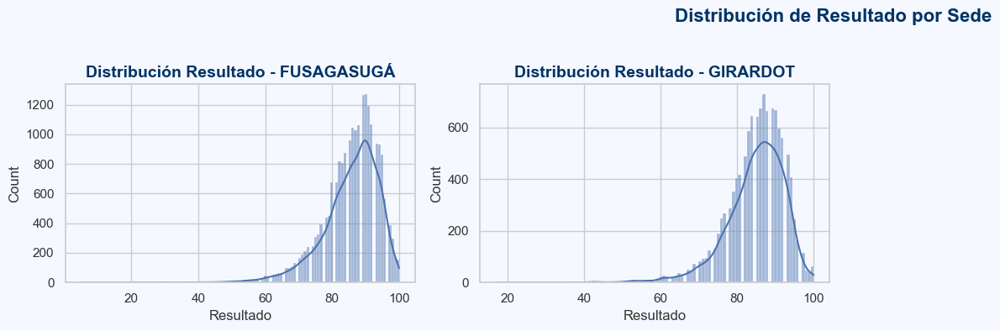

In [11]:
## Distribución de la variable objetivo (Resultado) por sede
funciones = []
sedes = df['Sede'].unique()
for sede in sedes:
    funciones.append(lambda ax, sede=sede: sns.histplot(
        data=df[df['Sede'] == sede],
        x='Resultado',
        kde=True,
        ax=ax).set_title(f"Distribución Resultado - {sede}"))

mostrar_graficos_en_grid(funciones, titulo_general="Distribución de Resultado por Sede")



C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\827448020.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  lambda ax, sede=sede, año=año: sns.barplot(
C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\827448020.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  lambda ax, sede=sede, año=año: sns.barplot(
C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\827448020.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  lambda ax, sede=sede, año=año: sns.barplot(
C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\827448020.py:19: FutureWarning: 

Passing `palette` without as

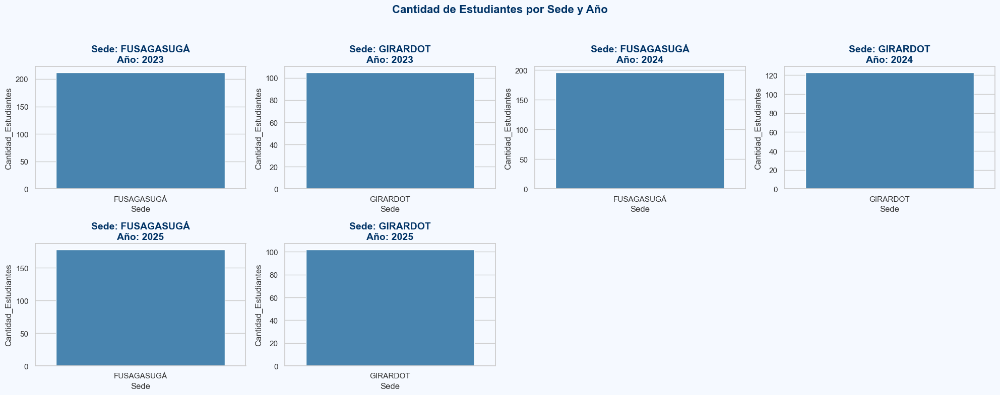

In [30]:
funciones = []

# Agrupar estudiantes únicos por sede y año
conteo = (
    df[['Identificación', 'Sede', 'Año']]
    .drop_duplicates()
    .groupby(['Sede', 'Año'])
    .size()
    .reset_index(name='Cantidad_Estudiantes')
)

# Crear función por combinación Sede - Año
combinaciones = conteo[['Sede', 'Año']].drop_duplicates().sort_values(by=['Año', 'Sede'])

for _, fila in combinaciones.iterrows():
    sede = fila['Sede']
    año = fila['Año']
    funciones.append(
        lambda ax, sede=sede, año=año: sns.barplot(
            data=conteo[(conteo['Sede'] == sede) & (conteo['Año'] == año)],
            x='Sede',
            y='Cantidad_Estudiantes',
            ax=ax,
            palette='Blues_d'
        ).set_title(f"Sede: {sede}\nAño: {año}")
    )

# Mostrar todos los gráficos
mostrar_graficos_en_grid(funciones, titulo_general="Cantidad de Estudiantes por Sede y Año")


In [12]:
tabla_docentes= df.groupby(['Sede', 'Año', 'Grado'])['Docente'].nunique().reset_index()
tabla_docentes.rename(columns={'Docente': 'Cantidad de Docentes'}, inplace=True)
display(tabla_docentes.head())

,Sede,Año,Grado,Cantidad de Docentes
0,FUSAGASUGÁ,2023,1,10
1,FUSAGASUGÁ,2023,2,8
2,FUSAGASUGÁ,2023,3,11
3,FUSAGASUGÁ,2023,4,10
4,FUSAGASUGÁ,2023,5,9


## 2.7. Cantidad de docentes por grado, sede y año

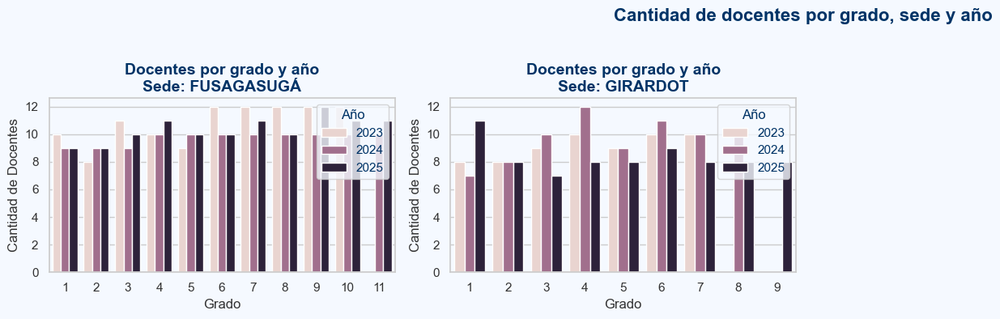

In [13]:
funciones = []
for sede in tabla_docentes['Sede'].unique():
    funciones.append(
        lambda ax, sede=sede: sns.barplot(
            data=tabla_docentes[tabla_docentes['Sede'] == sede],
            x='Grado', y='Cantidad de Docentes', hue='Año', ax=ax
        ).set_title(f"Docentes por grado y año\nSede: {sede}")
    )

mostrar_graficos_en_grid(funciones, titulo_general="Cantidad de docentes por grado, sede y año")


In [14]:
docentes_unicos = df['Docente'].dropna().unique()
docentes_unicos

array(['ALEJANDRA LEÓN DICELIS', 'KATHERINE CUBILLOS VÉLEZ',
       'TATIANA GONZÁLEZ MORENO', 'ALEJANDRA MORALES GARCÍA',
       'SANDRA SANTISTEBAN OSTOS', 'STEVEN BARRERO BUITRAGO',
       'YENNY SOTELO GÓMEZ', 'ARTURO GUZMÁN URREGO',
       'STIVENSON RINCÓN NAJAS', 'DAVID AMAYA HERRERA',
       'ALEJANDRA CABALLERO BOTELLO', 'MATEO GONZÁLEZ PENAGOS',
       'YINETH CRISTANCHO MONTOYA', 'ARMANDO ÁVILA CONTRERAS',
       'KATHERIN SÁNCHEZ MURILLO', 'TATIANA RAMOS NOVA',
       'HUMBERTO GIL SIERRA', 'JIMENA GÓMEZ ARÉVALO',
       'FERNANDO VILLALBA AROCA', 'CAROLINA ORDOÑEZ ACOSTA',
       'FERNANDO VILLALBA TORRES', 'IVONNE VIDAL TORRES',
       'PILAR RODRÍGUEZ ISAZA', 'JOHANA RODRÍGUEZ SÁNCHEZ',
       'VALENTINA SARABIA VARGAS', 'FELIPE SÁNCHEZ SALDARRIAGA',
       'NATALIA ALARCÓN POLANCO', 'GUILLERMO MARIOTTE PARRA',
       'JESSICA RODRÍGUEZ BOBADILLA', 'ANTONIO MARTÌNEZ FLORES',
       'MICHELLE ÁVILA TORRES', 'HERNANDO SUÁREZ DÍAZ',
       'MARÍA PRADA NAVARRO', 'NERY GUZMÁ

## 2.8. Distribución de Resultado por Asignatura y Docente

In [27]:
funciones = []

# Combinaciones únicas ordenadas
combinaciones = (
    df[['Docente', 'Asignatura', 'Grado']]
      .drop_duplicates()
      .sort_values(by=['Grado', 'Asignatura'])
)

for _, fila in combinaciones.iterrows():
    docente    = fila['Docente']
    asignatura = fila['Asignatura']
    grado      = fila['Grado']
    
    # Subconjunto de interés
    subset = df[(df['Docente'] == docente) &
                (df['Asignatura'] == asignatura) &
                (df['Grado'] == grado)]
    
    # Añadir solo si hay al menos un valor válido en 'Resultado'
    if subset['Resultado'].notna().any():
        funciones.append(
            lambda ax, docente=docente, asignatura=asignatura, grado=grado, subset=subset: sns.histplot(
                data=subset,
                x='Resultado',
                kde=True,
                ax=ax
            ).set_title(f"{asignatura}\n{docente}\nGrado: {grado}")
        )

mostrar_graficos_en_grid(
    funciones,
    titulo_general="Distribución de Resultado por Asignatura, Docente y Grado"
)




In [18]:
tabla_estudiantes = df.groupby(['Sede', 'Año', 'Grado'])['Identificación'].nunique().reset_index()
tabla_estudiantes.rename(columns={'Identificación': 'Cantidad de Estudiantes'}, inplace=True)
display(tabla_estudiantes.head())

,Sede,Año,Grado,Cantidad de Estudiantes
0,FUSAGASUGÁ,2023,1,24
1,FUSAGASUGÁ,2023,2,23
2,FUSAGASUGÁ,2023,3,26
3,FUSAGASUGÁ,2023,4,21
4,FUSAGASUGÁ,2023,5,23


## 2.9. Cantidad de estudiantes por grado, sede y año

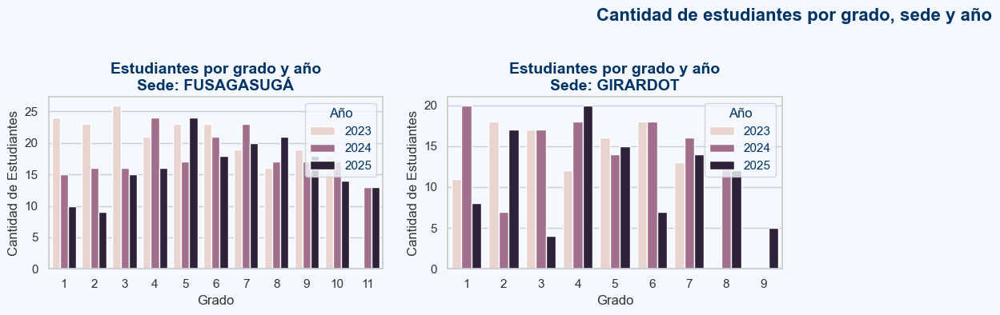

In [19]:
funciones = []
for sede in tabla_estudiantes['Sede'].unique():
    funciones.append(
        lambda ax, sede=sede: sns.barplot(
            data=tabla_estudiantes[tabla_estudiantes['Sede'] == sede],
            x='Grado', y='Cantidad de Estudiantes', hue='Año', ax=ax
        ).set_title(f"Estudiantes por grado y año\nSede: {sede}")
    )

mostrar_graficos_en_grid(funciones, titulo_general="Cantidad de estudiantes por grado, sede y año")


## 2.10. Relación entre variables numéricas y Resultado

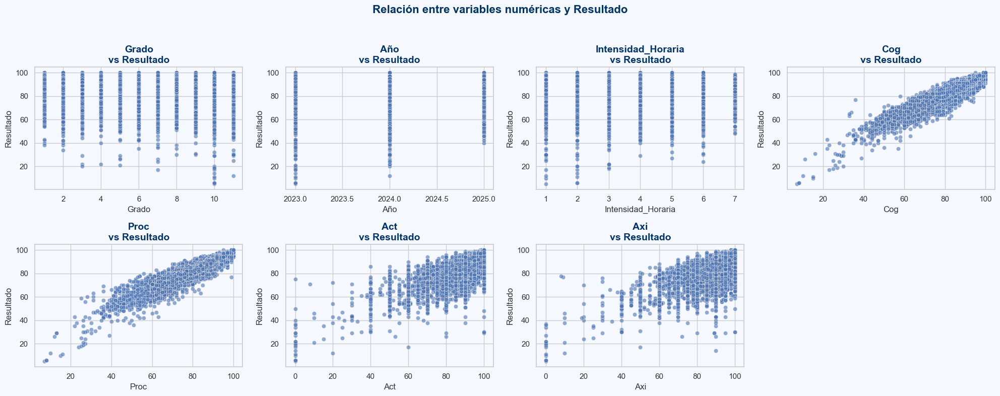

In [20]:

# 6. Relación entre variables numéricas y Resultado
funciones = []

num_vars = df.select_dtypes(include=np.number).columns.drop('Resultado')

for col in num_vars:
    funciones.append(
        lambda ax, col=col: sns.scatterplot(
            data=df,
            x=col,
            y='Resultado',
            alpha=0.6,
            ax=ax
        ).set_title(f'{col}\nvs Resultado')
    )

mostrar_graficos_en_grid(
    funciones,
    titulo_general="Relación entre variables numéricas y Resultado"
)



## 2.11. Correlación con la variable objetivo con mapa de calor

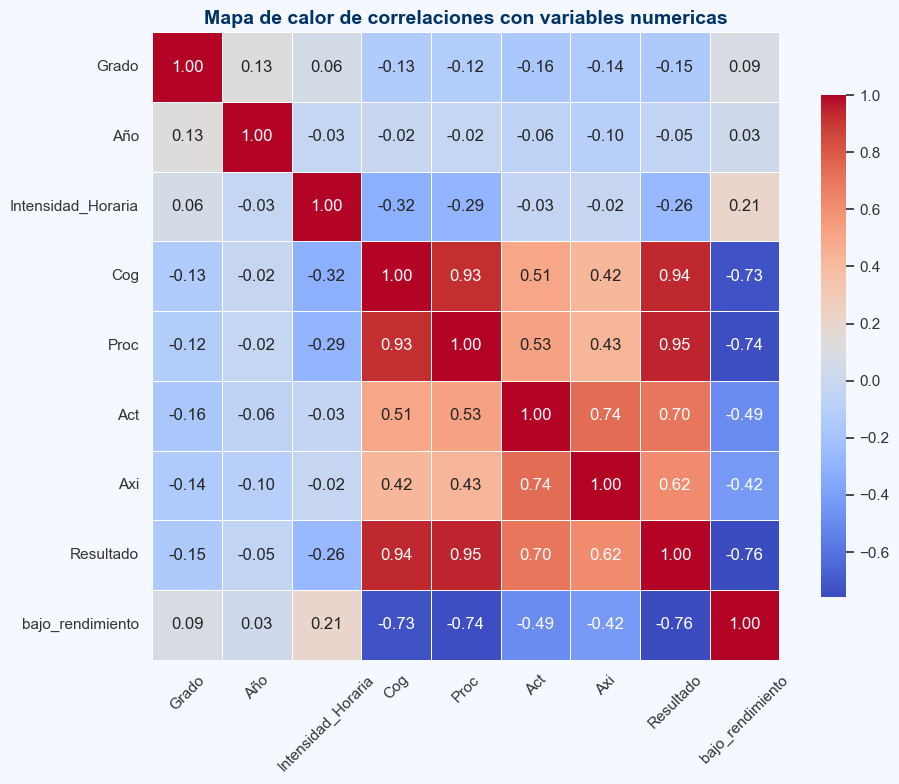

In [22]:
# 3. Correlación con la variable objetivo
configurar_estilo_bluelight()  # Aplicar estilo

corr = df.corr(numeric_only=True)

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('Mapa de calor de correlaciones con variables numericas', fontsize=14, weight='bold', color='#003366')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



In [23]:
df_codificado, mapeos = codificar_variables(df.copy())

C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\2574353967.py:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Sede'] = df['Sede'].replace(mapeos['Sede'])
C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\2574353967.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Grupo'] = df['Grupo'].replace(mapeos['Grupo'])
C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\2574353967.py:14: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly

## 2.12.  Correlación con la variable objetivo (Resultado) con variables codificadas

C:\Users\Cathe\AppData\Local\Temp\ipykernel_13236\2328633808.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlaciones.values, y=correlaciones.index, palette='Blues_r')


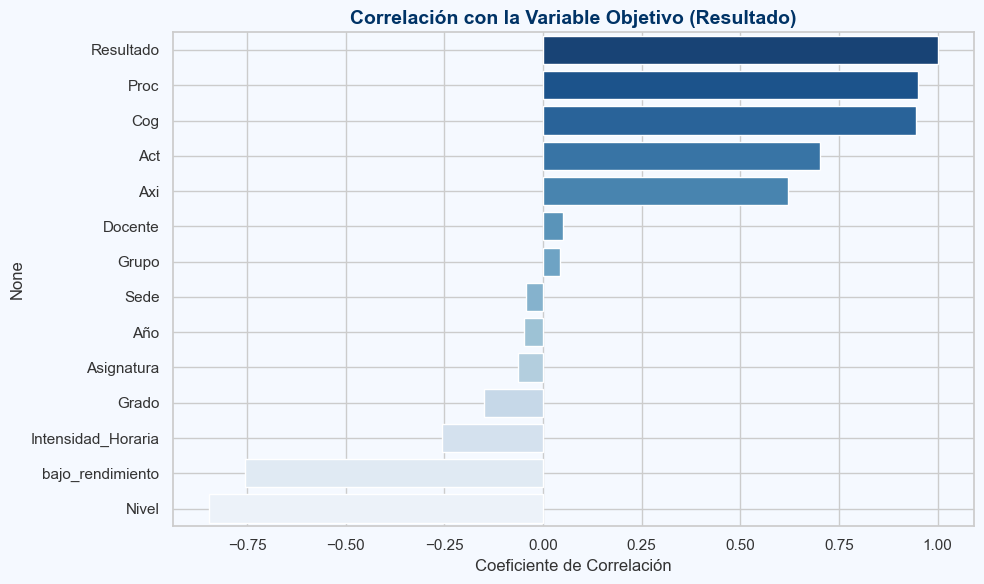

In [24]:
## Correlación con la variable objetivo (Resultado) con variables codificadas

plt.figure(figsize=(10, 6))
correlaciones = df_codificado.corr(numeric_only=True)['Resultado'].sort_values(ascending=False)
sns.barplot(x=correlaciones.values, y=correlaciones.index, palette='Blues_r')
plt.title("Correlación con la Variable Objetivo (Resultado)")
plt.xlabel("Coeficiente de Correlación")
plt.grid(True)
plt.tight_layout()
plt.show()

## 2.13. Distribución de Resultado según Intensidad Horaria

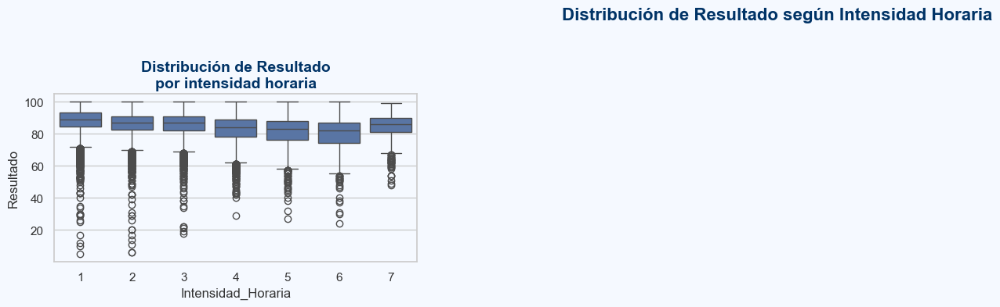

In [25]:
## Ejemplo: Distribución de notas por Intensidad_Horaria
funciones = []

# Boxplot de nota_siguiente por intensidad_horaria
funciones.append(lambda ax: sns.boxplot(
    data=df,
    x='Intensidad_Horaria',
    y='Resultado',
    ax=ax
).set_title("Distribución de Resultado\npor intensidad horaria"))

# Mostrar gráfico
mostrar_graficos_en_grid(funciones, titulo_general="Distribución de Resultado según Intensidad Horaria")


## 2.14. Distribución de Resultado por Asignatura y Sede

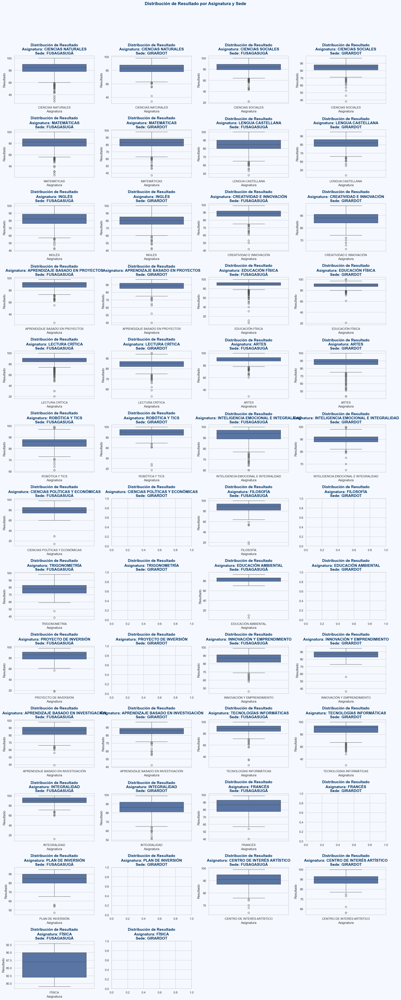

In [26]:
funciones = []
asignaturas = df['Asignatura'].unique()
sedes = df['Sede'].unique()

for asignatura in asignaturas:
    for sede in sedes:
        funciones.append(lambda ax, asignatura=asignatura, sede=sede: sns.boxplot(
            data=df[(df['Asignatura'] == asignatura) & (df['Sede'] == sede)],
            x='Asignatura',
            y='Resultado',
            ax=ax).set_title(f"Distribución de Resultado\nAsignatura: {asignatura}\nSede: {sede}"))

mostrar_graficos_en_grid(funciones, titulo_general="Distribución de Resultado por Asignatura y Sede")


## 2.15. Riesgo de Bajo Rendimiento por Grado

In [53]:
## Ejemplo: Comparación de riesgo por grado

funciones = []
grados = df['Grado'].unique()
for grado in grados:
    funciones.append(lambda ax, grado=grado: sns.histplot(
        data=df[df['Grado'] == grado],
        x='Resultado',
        hue='bajo_rendimiento',
        multiple='stack',
        ax=ax).set_title(f"Distribución por Resultado \n Grado {grado}"))

mostrar_graficos_en_grid(funciones, titulo_general="Riesgo de Bajo Rendimiento por Grado")



C:\Users\Cathe\AppData\Local\Temp\ipykernel_24500\643245729.py:40: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
